# Extract the threshold between normal polygons and bananas

In [1]:
import geopandas
from sklearn.neighbors import KernelDensity
import matplotlib.pyplot as plt
import numpy
import pandas

Get the sample of FUAs.

In [2]:
sample = geopandas.read_parquet("../data/sample.parquet")

Load one we know has a lot of _banana_ polygons, like Adelaide.

In [5]:
polygons = geopandas.read_parquet(f"../data/{int(789.0)}/polygons.parquet")

Plot the distribution of banana shape index. I am cutting the long tail here as we're not really interested in that.

(0.0, 400.0)

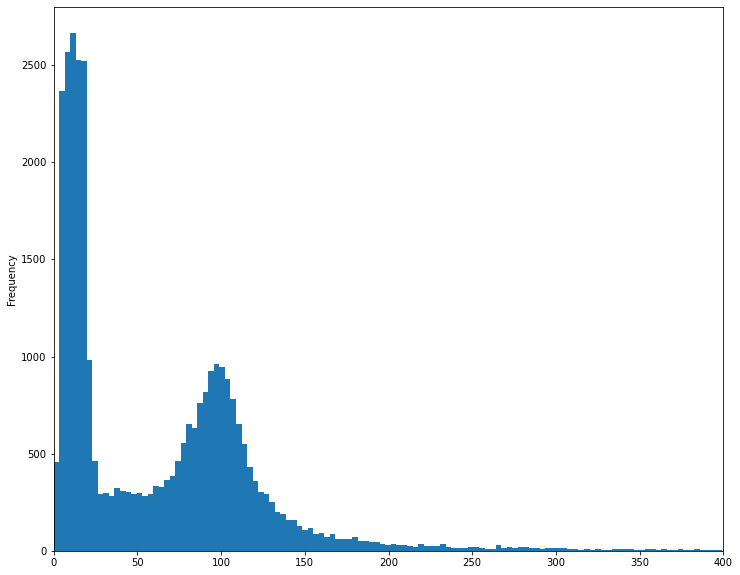

In [16]:
polygons.shape_index.plot.hist(figsize=(12, 10), bins=2000)
plt.xlim(0, 400)

Reshape the data for sklearn.

In [10]:
data = polygons.shape_index.values
data = data[data < 200].reshape(-1, 1)

Fit the Kernel Density function.

In [11]:
kde = KernelDensity(kernel="gaussian", bandwidth=5).fit(data)

Plot the result.

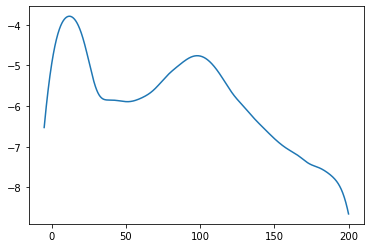

In [12]:
s = numpy.linspace(-5, 200, 1000)
e = kde.score_samples(s.reshape(-1, 1))
plt.plot(s, e)

## Extract minima and maxima

In [13]:
from scipy.signal import argrelextrema

In [14]:
mi, ma = argrelextrema(e, numpy.less)[0], argrelextrema(e, numpy.greater)[0]

In [15]:
s[mi]

array([51.02102102])

In [20]:
s[ma]

array([12.03203203, 98.01301301])

Check the outcome.

In [19]:
polygons.query("shape_index < 20").explore(prefer_canvas=True)